# DBSCAN Epsilon Estimation

In this notebook we want explore how to estimate the epsilon parameter of the DBSCAN to cluster the results of Differential Equation runs to study Bifurcations

## Approach 

Track the distribution of distances in the IC-P space depending on the Ps.

* First we solve an example system (1st order kuramoto network)

In [34]:
using LightGraphs
using Clustering
using DifferentialEquations
using Distributions
using HighBifLib
using StatsBase

In [77]:
N = 15
K = 0.5
nd = Normal(0.5, 0.2) # distribution for eigenfrequencies # mean = 0.5Hz, std = 0.5Hz
w_i_par = rand(nd,N) 

net = erdos_renyi(N, 0.2)
A = adjacency_matrix(net)


ic = zeros(N)
ic_dist = Uniform(-pi,pi)
kdist = Uniform(0,8)
ic_ranges = ()->rand(ic_dist)
N_ics = 3000
K_range = ()->rand(kdist)
pars = kuramoto_network_parameters(K, w_i_par, N, A)

# base problem
rp = ODEProblem(kuramoto_network, ic, (0.,3000.), pars)

tail_frac = 0.9 # 
ko_mcp = BifAnaMCProblem(rp, ic_ranges, N_ics, pars, (:K, K_range), eval_ode_run, tail_frac)
kosol = solve(ko_mcp)

HighBifLib.myMCSol(MonteCarloSolution Solution of length 3000 with uType:
Tuple{Array{Float64,1},Array{Float64,1},Array{Float64,1},Float64}, 3000, 400, 4)

we need the solution sorted 

In [78]:
kosol_s, ko_mcp_s = sort(kosol, ko_mcp);


In [86]:
DK = distance_matrix(kosol_s, parameter(ko_mcp_s));


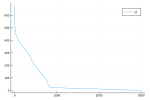

In [80]:
k = 4
fdist = k_dist(DK,k);
x = collect(1:kosol_s.N_mc)
Plots.plot(x[1:end],fdist[1:end])

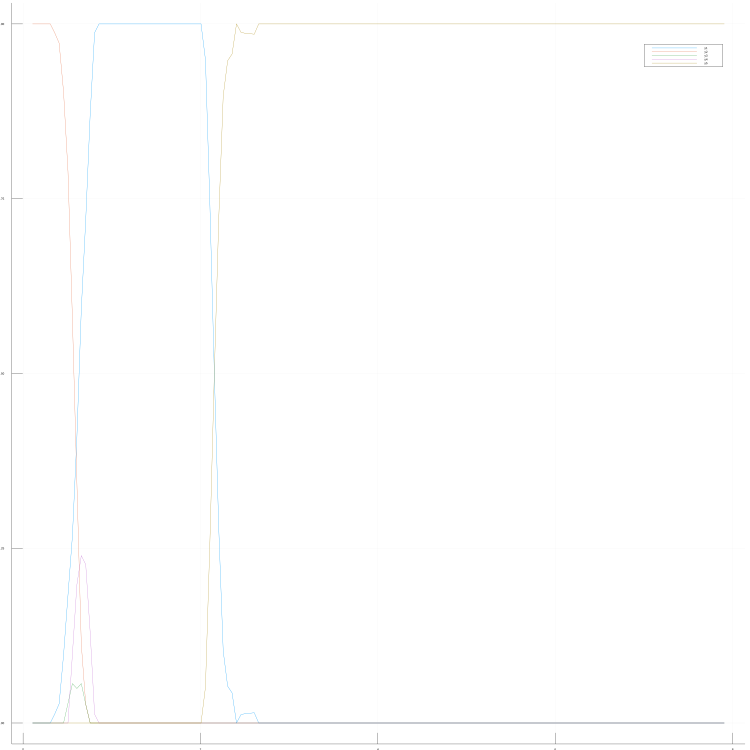

In [81]:
db_eps = 150
db_res = dbscan(full(DK),db_eps,k)
cluster_meas = cluster_measures(kosol_s,db_res);
cluster_n = cluster_n_noise(db_res);
cluster_members = cluster_membership(parameter(ko_mcp_s),db_res,0.2,0.05);
plot(cluster_members[1],cluster_members[2],size=(3000,3000))

We want to look at the regression/correlation of $dp$ to $dD$

In [82]:
dp = diff(parameter(ko_mcp_s));
Nd = length(dp);
dD = zeros(Nd);
for i=1:Nd
    dD[i] = D[i,i+1]
end

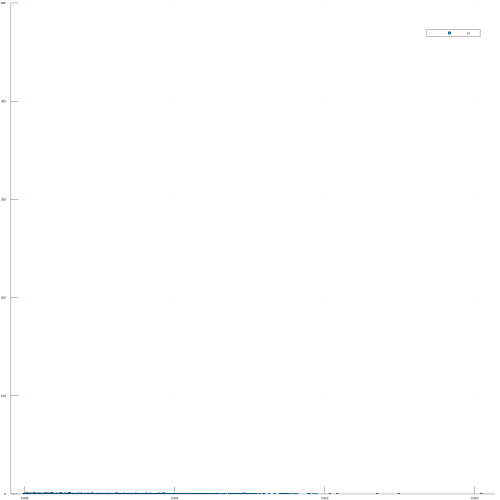

In [170]:
using Plots

plot(dp,dD,seriestype=:scatter, ylim=(0,500),size=(2000,2000))

In [171]:
dp2,dD2 = parResponse(parameter(ko_mcp_s),DK,0,7,10)
plot(dp2,dD2,seriestype=:scatter, ylim=(0,300),dpi=300)

In [38]:
crosscor(dp,dD,[0])

1-element Array{Float64,1}:
 0.00518793

also for logistic map..

In [92]:
rdist = Uniform(2.5,4)
icdist = Uniform(0.1,0.99)
@everywhere r = ()->rand(rdist)
@everywhere pars = logistic_parameters(r())
@everywhere ic_ranges = ()->rand(icdist)
@everywhere N_ic = 5000
@everywhere dp = DiscreteProblem(logistic, ic_ranges(), (0.,5000.), pars)

# computes several measures for non-normality, we can later choose which ones to use 
# by adjusting the weights in the distance calculation
function eval_ode_run_all(sol, i)
    (N_dim, __) = size(sol)
    state_filter = collect(1:N_dim)
    function ad_test(u::AbstractArray, mu::Number, sig::Number) 
        if sig>1e-10
            return sqrt(OneSampleADTest(u, Normal(mu,sig)).A²)
        else 
            return 0.
        end
    end 
    eval_funcs = [empirical_1D_KL_divergence_hist]
    global_eval_funcs = []
    eval_ode_run(sol, i, state_filter, eval_funcs, global_eval_funcs)
end

tail_frac = 0.8
log_emcp = BifAnaMCProblem(dp, ic_ranges, N_ic, pars, (:r,r), eval_ode_run_all, tail_frac)
log_sol = solve(log_emcp)
(ssol, sprob) = sort(log_sol, log_emcp)
D = @time distance_matrix(ssol, parameter(sprob), [1,0.75,0.5,1]);




 10.471845 seconds (109.92 M allocations: 5.642 GiB, 17.81% gc time)


In [58]:
D

5000×5000 PairwiseListMatrices.PairwiseListMatrix{Float64,false,Array{Float64,1}}:
 0.0         0.00165978   0.00225117   …  2.07301     2.06834     2.07994   
 0.00165978  0.0          0.000591391     2.07181     2.06714     2.07874   
 0.00225117  0.000591391  0.0             2.07138     2.06671     2.07831   
 0.00242058  0.000760801  0.00016941      2.07126     2.06659     2.07819   
 0.00252481  0.000865036  0.000273645     2.07118     2.06651     2.07811   
 0.00254892  0.000889138  0.000297748  …  2.07117     2.06649     2.07809   
 0.00257759  0.000917814  0.000326423     2.07115     2.06647     2.07807   
 0.00278497  0.00112519   0.000533803     2.071       2.06632     2.07792   
 0.0028116   0.00115182   0.00056043      2.07098     2.0663      2.0779    
 0.00309228  0.0014325    0.000841114     2.07077     2.0661      2.0777    
 0.00433431  0.00267453   0.00208314   …  2.06987     2.0652      2.0768    
 0.00467277  0.00301299   0.0024216       2.06963     2.06496     2.07

In [156]:
dp = diff(parameter(sprob));
Nd = length(dp);
dD = zeros(Nd);
for i=1:Nd
    dD[i] = D[i,i+1]
end

function parResponse(p,D,minpar,maxpar)
    ind = (p.>minpar) .& (p.<maxpar)
    dp = diff(p[ind])
    Dind = D[ind,ind]
    Nd = length(dp)
    dD = zeros(Nd)
    for i=1:Nd
        dD[i] = Dind[i,i+1]
    end 
    (dp, dD)
end 

function korderdiff(arrin, k)
    arrin[1+k:end] - arrin[1:end-k]
end

function parResponse(p,D,minpar,maxpar,order::Int)
    ind = (p.>minpar) .& (p.<maxpar)
    pi = p[ind]
    Di = D[ind,ind]
    
    dp = []
    dD = []
    for iorder=1:order
        idp = korderdiff(pi,iorder)
        
        iN = length(idp)
        idD = zeros(iN)
        for i=1:iN
            idD[i] = Di[i,i+iorder]
        end 
        push!(dp,idp)
        push!(dD,idD)
    end 
    (vcat(dp...),vcat(dD...))
    # vcat.... or other concate
end

    

parResponse (generic function with 3 methods)

In [101]:
?diff

search: diff diffusion difference DiffEqJump DiffEqBase DiffEqArray



```
diff(A, [dim::Integer=1])
```

Finite difference operator of matrix or vector `A`. If `A` is a matrix, compute the finite difference over a dimension `dim` (default `1`).

# Example

```jldoctest
julia> a = [2 4; 6 16]
2×2 Array{Int64,2}:
 2   4
 6  16

julia> diff(a,2)
2×1 Array{Int64,2}:
  2
 10
```


In [157]:
dp3,dD3 = parResponse(parameter(sprob),D,2,3,3)

([0.000197892, 0.00021283, 0.000588249, 0.00113367, 0.000159721, 0.000618332, 2.21359e-5, 0.00100133, 6.84049e-6, 0.000369233  …  0.000371258, 0.000108934, 0.000202024, 0.00141218, 0.00154708, 0.00152538, 0.000953232, 0.000879737, 0.00129042, 0.00105592], [0.000229553, 0.000246874, 0.000682315, 0.00131483, 0.000185231, 0.000717059, 2.56694e-5, 0.0011611, 7.93152e-6, 0.000428116  …  0.0306421, 0.0061573, 0.00884211, 0.00616554, 0.00695337, 0.023335, 0.119778, 0.149283, 0.301876, 0.45294])

In [158]:
dp3

4812-element Array{Float64,1}:
 0.000197892
 0.00021283 
 0.000588249
 0.00113367 
 0.000159721
 0.000618332
 2.21359e-5 
 0.00100133 
 6.84049e-6 
 0.000369233
 0.000138516
 0.000129074
 3.78772e-5 
 ⋮          
 0.000547275
 0.000508897
 0.000371258
 0.000108934
 0.000202024
 0.00141218 
 0.00154708 
 0.00152538 
 0.000953232
 0.000879737
 0.00129042 
 0.00105592 

In [134]:
dp2

1605-element Array{Float64,1}:
 0.000197892
 0.00021283 
 0.000588249
 0.00113367 
 0.000159721
 0.000618332
 2.21359e-5 
 0.00100133 
 6.84049e-6 
 0.000369233
 0.000138516
 0.000129074
 3.78772e-5 
 ⋮          
 0.000334267
 1.52299e-5 
 2.1761e-5  
 7.19428e-5 
 0.00010832 
 0.00123192 
 0.000206843
 8.66157e-5 
 0.000659773
 0.000133349
 0.0004973  
 0.000425275

In [163]:
dp2,dD2 = parResponse(parameter(sprob),D,2,6,10)

([0.000197892, 0.00021283, 0.000588249, 0.00113367, 0.000159721, 0.000618332, 2.21359e-5, 0.00100133, 6.84049e-6, 0.000369233  …  0.00109027, 0.00119529, 0.00199057, 0.00207496, 0.00225404, 0.00315653, 0.00331482, 0.00335681, 0.0033484, 0.00319801], [0.000229553, 0.000246874, 0.000682315, 0.00131483, 0.000185231, 0.000717059, 2.56694e-5, 0.0011611, 7.93152e-6, 0.000428116  …  0.0387665, 0.0191522, 0.0421414, 0.0508485, 0.00653729, 0.108661, 0.0892098, 0.103991, 0.021899, 0.0295183])

In [164]:
plot(dp2,dD2,seriestype=:scatter, size=(2000, 2000),ylim=(0,0.005),xlim=(0,0.005))

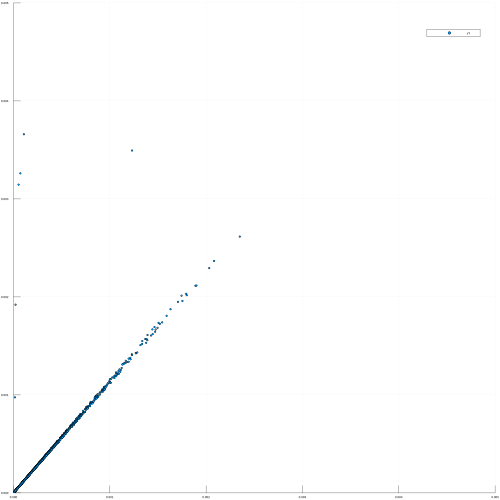

In [142]:
plot(dp2,dD2,seriestype=:scatter, size=(2000, 2000),ylim=(0,0.005),xlim=(0,0.005))

In [65]:
crosscor(dp2,dD2,[0])

1-element Array{Float64,1}:
 0.0434766

In [48]:
crosscor(dp,dD,[0])

1-element Array{Float64,1}:
 0.0779304